# Import and function definition

In [22]:
from math import ceil    
from collections import Counter

import joblib
import os 
import glob
import matplotlib.pyplot as plt
from pprint import pprint

import numpy as np
%matplotlib notebook

In [23]:
def open_simulation_files(simulation_folder):
#     pprint(os.path.join(simulation_folder, 'test_record.jbl'))
    test = joblib.load(os.path.join(simulation_folder, 'test_record.jbl'))
    simulation = joblib.load(os.path.join(simulation_folder, 'simulation_params.jbl'))
    goal_sampler = joblib.load(os.path.join(simulation_folder, 'goal_sampler_record.jbl'))    
    # log = joblib.load(os.path.join(simulation, 'log.log'))
    return test, simulation, goal_sampler

def load_simulation(simulation):
    test_record, simulation_params, goal_sampler_record = open_simulation_files(simulation)
    episodes = list(test_record.keys())
    flattened_record = flatten(test_record)
#     pprint(test_record)

    goal_records = goal_sampler_record['goals_record']
    reached_counter = {k:v['reached_counter'] for k,v in goal_records.items()}
    target_counter = {k:v['target_counter'] for k,v in goal_records.items()}
    discovery_records = {k:v['iter_discovery'] for k,v in goal_records.items()}
    return flattened_record, reached_counter, target_counter, discovery_records, episodes

def load_simulation_list(simulation_list):
    pprint(simulation_list)
    flattened_records = {}
    reached_counters = {}
    target_counters = {}
    discovery_records = {}
    episodes = [0]
    for simulation in simulation_list:
        test_records, reached, target, discovery, ep = load_simulation(simulation)
        if max(episodes) < max(ep):
            episodes = ep
#         test_record, simulation_params, goal_sampler_record = open_simulation_files(simulation)
#         test_record = flatten(test_record)
        for k,v in test_records.items():
            try:
                flattened_records[k].append(v)
            except KeyError:
                flattened_records[k] = [v]
        
        for k in reached.keys():
            try:
                reached_counters[k].append(reached[k])
                target_counters[k].append(target[k])
                discovery_records[k].append(discovery[k])
            except KeyError:
                reached_counters[k] = [reached[k]]
                target_counters[k] = [target[k]]
                discovery_records[k] = [discovery[k]]
#         print('done')

    for k, v in flattened_records.items():
        u = np.full((len(simulation_list), len(episodes)), np.nan)
        for i in range(len(v)):
            u[i, :len(v[i])] = v[i]
        flattened_records[k] = u
    
    return flattened_records, reached_counters, target_counters, discovery_records, episodes

In [24]:
def flatten(d):
    deal_with_overall_results(d)
    def aux(d, out):
        for k,v in d.items():
            if isinstance(v, dict):
                aux(v, out)
            else:
                try:
                    out[k].append(v)
                except KeyError:
                    out[k] = [v]
                    
    out = {}
    for val in d.values():
        if isinstance(val, dict):
            aux(val, out)
    return out

def replace_key(d, key, replace_by):
    try:
        v = d.pop(key)
        d[replace_by] = v
    except KeyError:
        pass
    

def deal_with_overall_results(d):
    thing_list = list(list(d.values())[0].keys())
    for v in d.values():
        for t in thing_list:
            if t != 'overall':
                replace_key(v[t], 'overall', f'overall_{t}')
            

In [35]:
def incr_ij(i,j, ncols):
    if j == ncols - 1:
        return i+1, 0
    else:
        return i, j+1
    
def get_idx(n_fig, ncols):
    i,j = 0,0
#     idx = [(i,j)]
    idx=[]
    for k in range(n_fig):
        idx.append((i,j))
        i, j = incr_ij(i,j,ncols)
    return idx

def hide_empty_subplots(fig):
    for ax in fig.axes:
        if not ax.has_data():
            ax.set_visible(False)
            
def plot_average_success_rates(episodes, flattened_test_record, axes, reached_counter=None, iter_discovery=None, 
                               std_record=None, display_goal_sampler_info=True, name='', color=None):
    
    for k,v in flattened_test_record.items():
        ax = axes[k]
#         if ax is None:
#             next_idx = axes['next_idx']
#             axes[k] = axes['all_axes'][next_idx]
#             axes['next_idx'] = incr_ij(*next_idx, ncols)
#             ax = axes[k]
        ax.plot(episodes, v, label=name, color=color)
        if std_record:
            ax.fill_between(episodes, v-std_record[k], v+std_record[k], alpha=0.4, color=color, linewidth=0)
        ax.set_title(k, pad=15)
        ax.set_ylim(0,1.1)
        
        if display_goal_sampler_info:
            try:
                ax.text(1, 0.85, f'pos. ex:{reached_counter[k]} \n'
                                 f'disc:{iter_discovery[k]}',
                    horizontalalignment='right',
                    verticalalignment='bottom',
                    transform=ax.transAxes)
            except KeyError:
                pass

#         i,j = incr_ij(i, j, ncols)

#     return fig, axes

def prepare_figures(keys, ncols=3):
    nline = ceil(len(keys) / ncols)
    print(nline, ncols)
    fig, axes = plt.subplots(nline, ncols, figsize=(15,15), sharex=True, sharey=True)
    plt.subplots_adjust(hspace=0.6)
#     index_list = get_idx(len(flattened_test_record), ncols)
#     axes = dict(all_axes=axes, next_idx=incr_ij(*index_list[-1], ncols))
    axes = {k: ax for k, ax in zip(sorted(keys), axes.flatten())}
    return fig, axes

def compare_average_success_rate(*folders):
    """
    each folders should be a tuple (name, path), path is a list of simulation records path and name is the simulation name
    """
    keys_counter = Counter()
    all_records = dict()
    for (name, f) in folders:
        flattened_records, reached_counters, target_counters, discovery_records, episodes = load_simulation_list(f)
#         print(flattened_records)
        average_flattened = {k: np.nanmean(v, 0) for k,v in flattened_records.items()}
#         print(average_flattened)
        std_flattened = {k: np.nanstd(v, 0) for k,v in flattened_records.items()}
        keys_counter.update(average_flattened.keys())
        all_records.update({name: (average_flattened, std_flattened, episodes)})
    
    fig, axes = prepare_figures(keys_counter.keys())
    for (name, (average_flattened, std_flattened, episodes)), i in zip(all_records.items(), range(len(all_records))):
        print(name)
        plot_average_success_rates(episodes=episodes, flattened_test_record=average_flattened, std_record=std_flattened, axes=axes,
                                   display_goal_sampler_info=False, name=name, color=f'C{i}')    
#     axes = axes['all_axes']
    handles, labels = axes[keys_counter.most_common(1)[0][0]].get_legend_handles_labels()
    print('************************************', labels)
    fig.legend(handles, labels, loc='upper right')
    fig.suptitle('Average success_rate on a test set evaluated per description in different condition during training')
    hide_empty_subplots(fig)
    return fig, axes

    
def plot_goal_record(reached_counter, target_counter):
    ind = np.arange(len(goal_records))  # the x locations for the groups
    width = 0.2     # the width of the bars

    fig, ax = plt.subplots(figsize=(20,5))
    ax.bar(ind, reached_counter.values(),width, color='r', label = 'reached_counter')
    ax.bar(ind+width, target_counter.values(),width, color='g', label = 'target_counter')

    ax.set_xticks(ind + width)
    ax.set_xticklabels(goal_records.keys())
    plt.setp(ax.get_xticklabels(), rotation=30, horizontalalignment='right', fontsize='x-small')
    
    ax.legend()
    fig.tight_layout()
    
def load_and_plot(path):
    flattened_records, reached_counters, target_counters, discovery_records, episodes = load_simulation_list(path)
    reached_averaged = {k: (np.round(np.nanmean(v)),np.round(np.std(v), 1)) for k,v in reached_counters.items()}
    average_discovery = {k: (np.round(np.nanmean(v)),np.round(np.std(v), 1)) for k,v in discovery_records.items()}
    average_flattened = {k: np.nanmean(v, 0) for k,v in flattened_records.items()}
    std_flattened = {k: np.nanstd(v, 0) for k,v in flattened_records.items()}
    fig, axes = plot_average_success_rates(episodes, average_flattened, reached_averaged, std_record=std_flattened, iter_discovery=average_discovery)          
    hide_empty_subplots(fig)

In [14]:
# for g in glob.glob('results/simulation_<*'):
#     rep = g.split('_')[-2]
#     c = g.split("'")[-2].split('.')[-1]
#     os.rename(g, g.replace(rep, c))

# Plot one simulation

In [17]:
# simulation_name = 'two_simple'
# simulation_name = 'simple_alwayson'
simulation_name = 'adorne'
# simulation_name = 'bigass'
folders = glob.glob(f'results/thesis_sim/DoubleAttentionContext/simulation_{simulation_name}*')
print(folders)

['results/thesis_sim/DoubleAttentionContext/simulation_adorne_1', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_2', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_7', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_5', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_3', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_9', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_4', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_6', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_0', 'results/thesis_sim/DoubleAttentionContext/simulation_adorne_8']


'results/simulation_two_simple_5/test_record.jbl'
done
'results/simulation_two_simple_0/test_record.jbl'
done
'results/simulation_two_simple_4/test_record.jbl'
done
'results/simulation_two_simple_6/test_record.jbl'
done
'results/simulation_two_simple_7/test_record.jbl'
done
'results/simulation_two_simple_1/test_record.jbl'
done
'results/simulation_two_simple_3/test_record.jbl'
done
'results/simulation_two_simple_2/test_record.jbl'
done


<IPython.core.display.Javascript object>


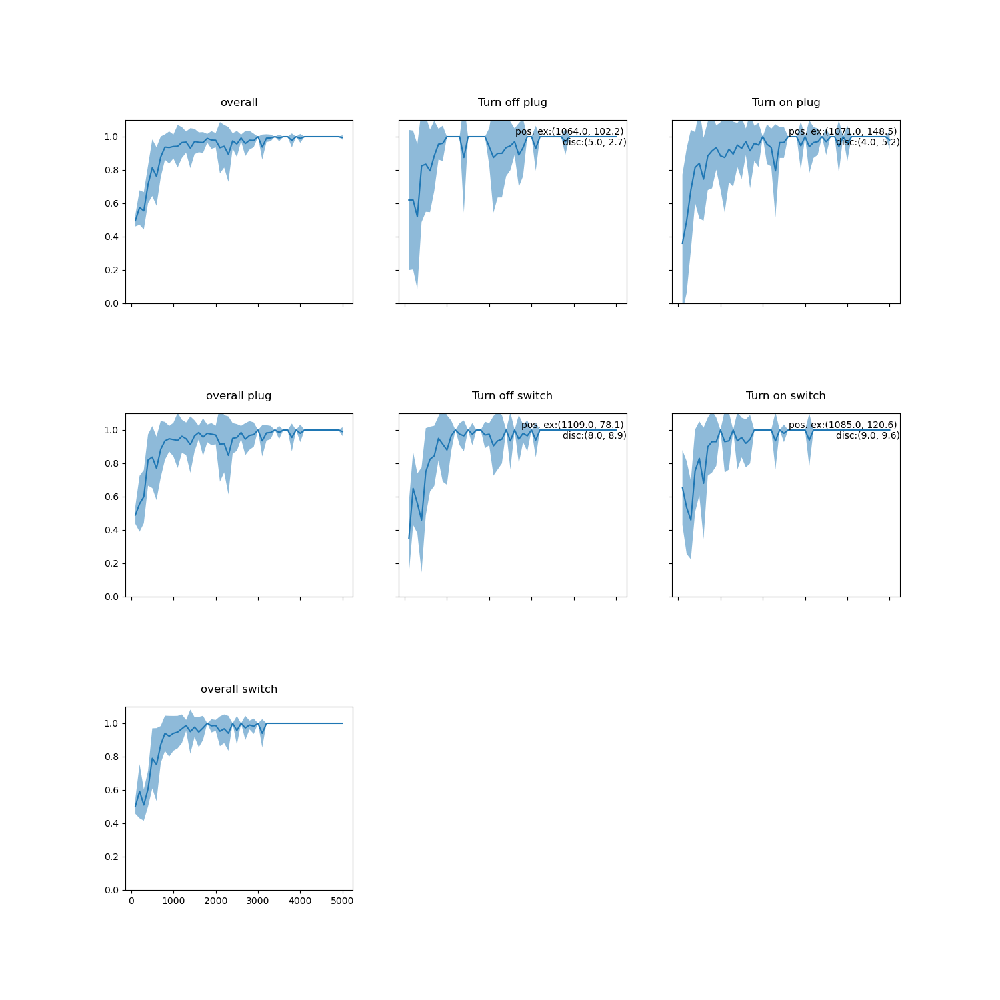

In [5]:
# simulation_name = 'two_simple'
# simulation_name = 'simple_alwayson'
simulation_name = ''
# simulation_name = 'bigass'
# folders = glob.glob(f'results/thesis_sim/twosimple/simulation_{simulation_name}*')
folders = glob.glob(f'results/simulation_two_simple*')

# flattened_records, reached_counters, target_counters, discovery_records, episodes = load_simulation_list(folders)
# reached_averaged = {k: (np.round(np.mean(v)),np.round(np.std(v), 1)) for k,v in reached_counters.items()}
# average_discovery = {k: (np.round(np.mean(v)),np.round(np.std(v), 1)) for k,v in discovery_records.items()}
# average_flattened = {k: np.mean(v, 0) for k,v in flattened_records.items()}
# std_flattened = {k: np.nanstd(v, 0) for k,v in flattened_records.items()}
# fig, axes = plot_average_success_rates(episodes, average_flattened, reached_averaged, std_record=std_flattened, iter_discovery=average_discovery)          
# hide_empty_subplots(fig)

load_and_plot(folders)

'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_0/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_3/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_8/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_1/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_9/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_6/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_7/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_2/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_4/test_record.jbl'
done
'results/thesis_sim/DoubleAttentionContext/simulation_simple_alwayson_5/test_record.jbl'
done


<IPython.core.display.Javascript object>


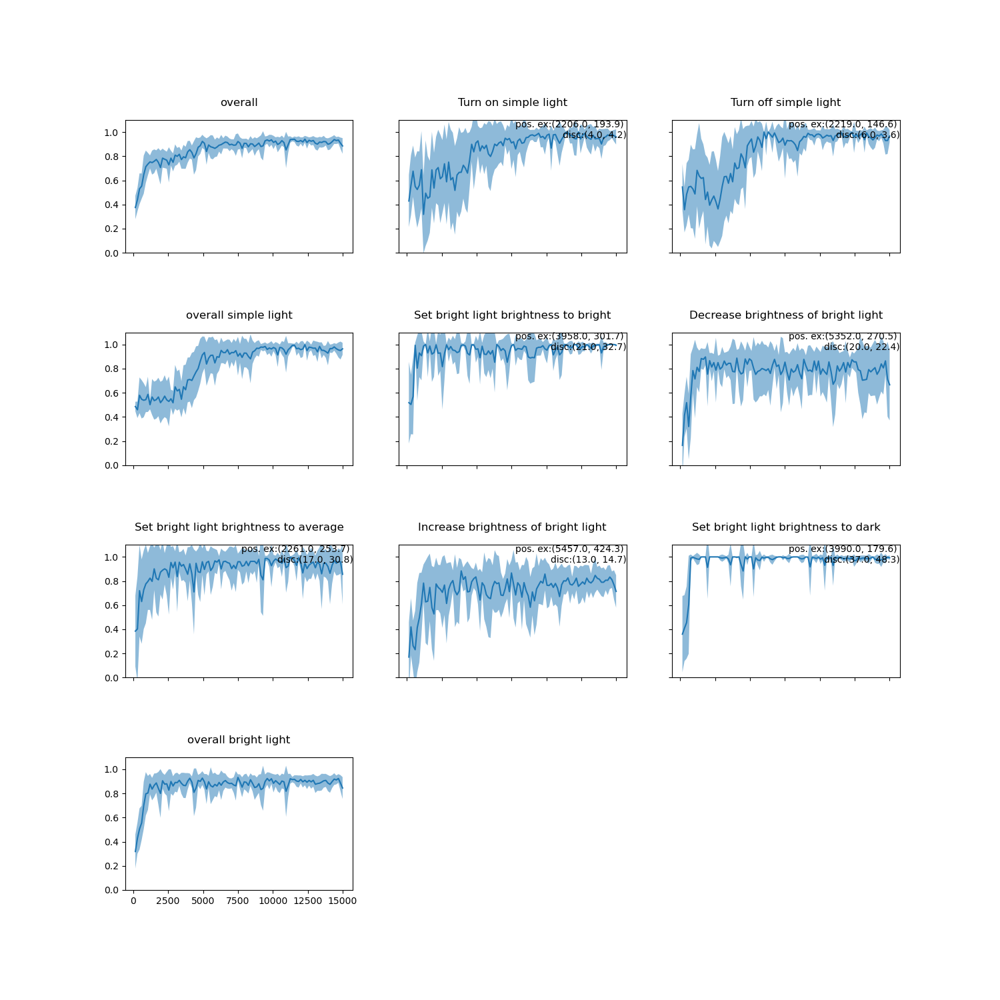

In [20]:
# simulation_name = 'two_simple'
simulation_name = 'simple_alwayson'
# simulation_name = 'adorne'
# simulation_name = 'bigass'
folders = glob.glob(f'results/thesis_sim/DoubleAttentionContext/simulation_{simulation_name}*')
flattened_records, reached_counters, target_counters, discovery_records, episodes = load_simulation_list(folders)
reached_averaged = {k: (np.round(np.mean(v)),np.round(np.std(v), 1)) for k,v in reached_counters.items()}
average_discovery = {k: (np.round(np.mean(v)),np.round(np.std(v), 1)) for k,v in discovery_records.items()}
average_flattened = {k: np.mean(v, 0) for k,v in flattened_records.items()}
std_flattened = {k: np.nanstd(v, 0) for k,v in flattened_records.items()}
fig, axes = plot_average_success_rates(episodes, average_flattened, reached_averaged, std_record=std_flattened, iter_discovery=average_discovery)          
hide_empty_subplots(fig)

<IPython.core.display.Javascript object>


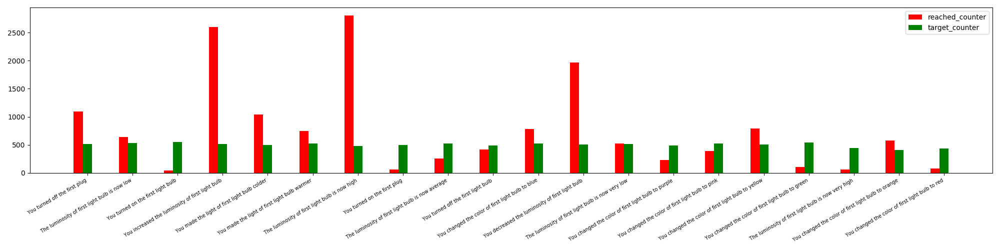

[Text(0, 0, 'You turned off the first plug'), Text(0, 0, 'The luminosity of first light bulb is now low'), Text(0, 0, 'You turned on the first light bulb'), Text(0, 0, 'You increased the luminosity of first light bulb'), Text(0, 0, 'You made the light of first light bulb colder'), Text(0, 0, 'You made the light of first light bulb warmer'), Text(0, 0, 'The luminosity of first light bulb is now high'), Text(0, 0, 'You turned on the first plug'), Text(0, 0, 'The luminosity of first light bulb is now average'), Text(0, 0, 'You turned off the first light bulb'), Text(0, 0, 'You changed the color of first light bulb to blue'), Text(0, 0, 'You decreased the luminosity of first light bulb'), Text(0, 0, 'The luminosity of first light bulb is now very low'), Text(0, 0, 'You changed the color of first light bulb to purple'), Text(0, 0, 'You changed the color of first light bulb to pink'), Text(0, 0, 'You changed the color of first light bulb to yellow'), Text(0, 0, 'You changed the color of firs

In [147]:
plot_goal_record(reached_counter, target_counter)

In [8]:
s = "simpleAtt"
glob.glob(f'{folder}{s}_[0-9]')

['results/thesis_sim/BigASS_archi_comprison/simulation_bigass_simpleAtt_0',
 'results/thesis_sim/BigASS_archi_comprison/simulation_bigass_simpleAtt_3',
 'results/thesis_sim/BigASS_archi_comprison/simulation_bigass_simpleAtt_4',
 'results/thesis_sim/BigASS_archi_comprison/simulation_bigass_simpleAtt_5',
 'results/thesis_sim/BigASS_archi_comprison/simulation_bigass_simpleAtt_1',
 'results/thesis_sim/BigASS_archi_comprison/simulation_bigass_simpleAtt_2']

['results/simulation_hue_debug_3',
 'results/simulation_hue_debug_10',
 'results/simulation_hue_debug_0',
 'results/simulation_hue_debug_4',
 'results/simulation_hue_debug_8',
 'results/simulation_hue_debug_1',
 'results/simulation_hue_debug_2',
 'results/simulation_hue_debug_5',
 'results/simulation_hue_debug_11',
 'results/simulation_hue_debug_7',
 'results/simulation_hue_debug_6',
 'results/simulation_hue_debug_9']
['results/simulation_structuredhue_3',
 'results/simulation_structuredhue_6',
 'results/simulation_structuredhue_2',
 'results/simulation_structuredhue_1',
 'results/simulation_structuredhue_7',
 'results/simulation_structuredhue_0',
 'results/simulation_structuredhue_5',
 'results/simulation_structuredhue_8',
 'results/simulation_structuredhue_4']
['results/simulation_alwaysonstructuredhue_3',
 'results/simulation_alwaysonstructuredhue_8',
 'results/simulation_alwaysonstructuredhue_6',
 'results/simulation_alwaysonstructuredhue_1',
 'results/simulation_alwaysonstructured

<IPython.core.display.Javascript object>


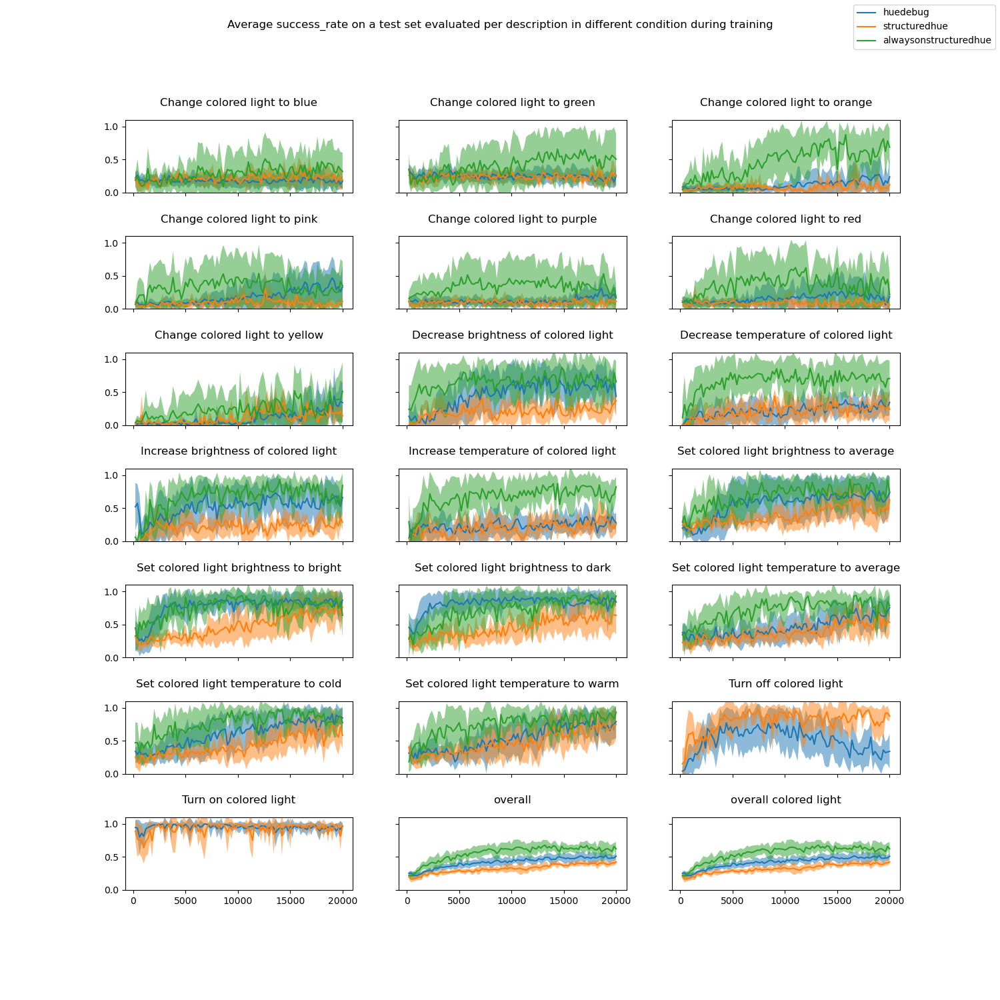

huedebug
structuredhue
alwaysonstructuredhue
************************************ ['huedebug', 'structuredhue', 'alwaysonstructuredhue']


In [57]:
folder = "results/thesis_sim/hue/simulation_hue_"
simulation_names = ["filter", "new_description", "doubleAtt_secondAtt"]
d = [(s, glob.glob(f'{folder}{s}*')) for s in simulation_names]


d = [
    ("huedebug", glob.glob(f'results/simulation_hue_debug_[0-9]*')), 
     ("structuredhue", glob.glob(f'results/simulation_structuredhue_[0-9]*')),
    ("alwaysonstructuredhue", glob.glob(f'results/simulation_alwaysonstructuredhue_[0-9]*'))
]
# s = "simpleAtt"
# d.append((s, glob.glob(f'{folder}{s}_[0-9]')))
# s = 'simulation_no_clipping_up_target_10_no_per'
# f8 = (s, glob.glob(f'results/temp/{s}*'))

# s = 'simulation_no_clipping_up_target_10'
# f9 = (s, glob.glob(f'results/temp/{s}*'))

fig, axes = compare_average_success_rate(*d)

['results/simulation_alwaysonstructuredhue_3',
 'results/simulation_alwaysonstructuredhue_8',
 'results/simulation_alwaysonstructuredhue_6',
 'results/simulation_alwaysonstructuredhue_1',
 'results/simulation_alwaysonstructuredhue_5',
 'results/simulation_alwaysonstructuredhue_4',
 'results/simulation_alwaysonstructuredhue_7',
 'results/simulation_alwaysonstructuredhue_2',
 'results/simulation_alwaysonstructuredhue_0']
['results/simulation_structuredhue_3',
 'results/simulation_structuredhue_6',
 'results/simulation_structuredhue_2',
 'results/simulation_structuredhue_1',
 'results/simulation_structuredhue_7',
 'results/simulation_structuredhue_0',
 'results/simulation_structuredhue_5',
 'results/simulation_structuredhue_8',
 'results/simulation_structuredhue_4']
['results/simulation_huealwayson_3colors_37',
 'results/simulation_huealwayson_3colors_38',
 'results/simulation_huealwayson_3colors_35',
 'results/simulation_huealwayson_3colors_42',
 'results/simulation_huealwayson_3colors_3

<IPython.core.display.Javascript object>


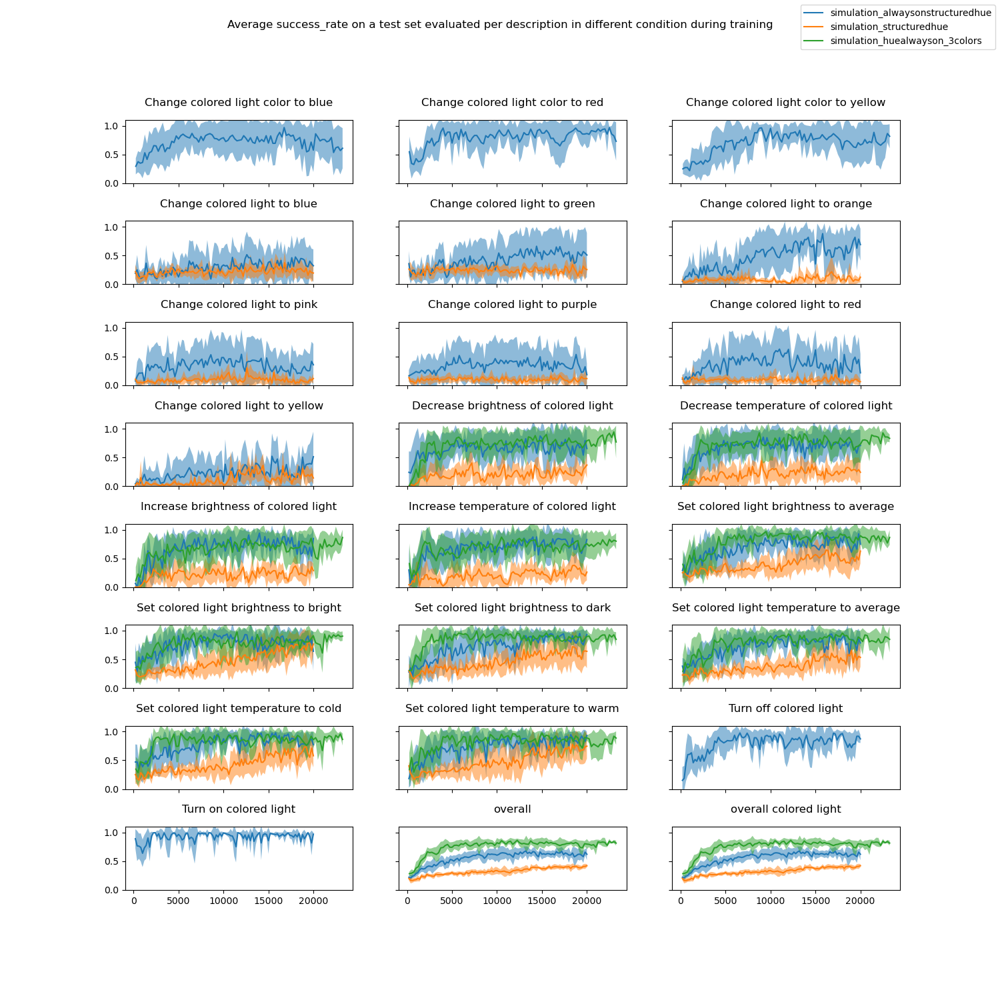

simulation_alwaysonstructuredhue
simulation_structuredhue
simulation_huealwayson_3colors
************************************ ['simulation_alwaysonstructuredhue', 'simulation_structuredhue', 'simulation_huealwayson_3colors']


In [77]:
folder = "results/"
simulation_names = ["simulation_alwaysonstructuredhue", "simulation_structuredhue", "simulation_huealwayson_3colors"]
d = [(s, glob.glob(f'{folder}{s}_[0-9]*')) for s in simulation_names]
# s = "simpleAtt"
# d.append((s, glob.glob(f'{folder}{s}_[0-9]')))
# s = 'simulation_no_clipping_up_target_10_no_per'
# f8 = (s, glob.glob(f'results/temp/{s}*'))

# s = 'simulation_no_clipping_up_target_10'
# f9 = (s, glob.glob(f'results/temp/{s}*'))

fig, axes = compare_average_success_rate(*d)

'results/simulation_bigass_14/test_record.jbl'
done
'results/simulation_bigass_3/test_record.jbl'
done
'results/simulation_bigass_7/test_record.jbl'
done
'results/simulation_bigass_4/test_record.jbl'
done
'results/simulation_bigass_6/test_record.jbl'
done
'results/simulation_bigass_2/test_record.jbl'
done
'results/simulation_bigass_9/test_record.jbl'
done
'results/simulation_bigass_5/test_record.jbl'
done
'results/simulation_bigass_16/test_record.jbl'
done
'results/simulation_bigass_0/test_record.jbl'
done
'results/simulation_bigass_13/test_record.jbl'
done
'results/simulation_bigass_8/test_record.jbl'
done
'results/simulation_bigass_11/test_record.jbl'
done
'results/simulation_bigass_15/test_record.jbl'
done
'results/simulation_bigass_1/test_record.jbl'
done
'results/simulation_bigass_10/test_record.jbl'
done
'results/simulation_bigass_12/test_record.jbl'
done
'results/simulation_bigass_17/test_record.jbl'
done


<IPython.core.display.Javascript object>


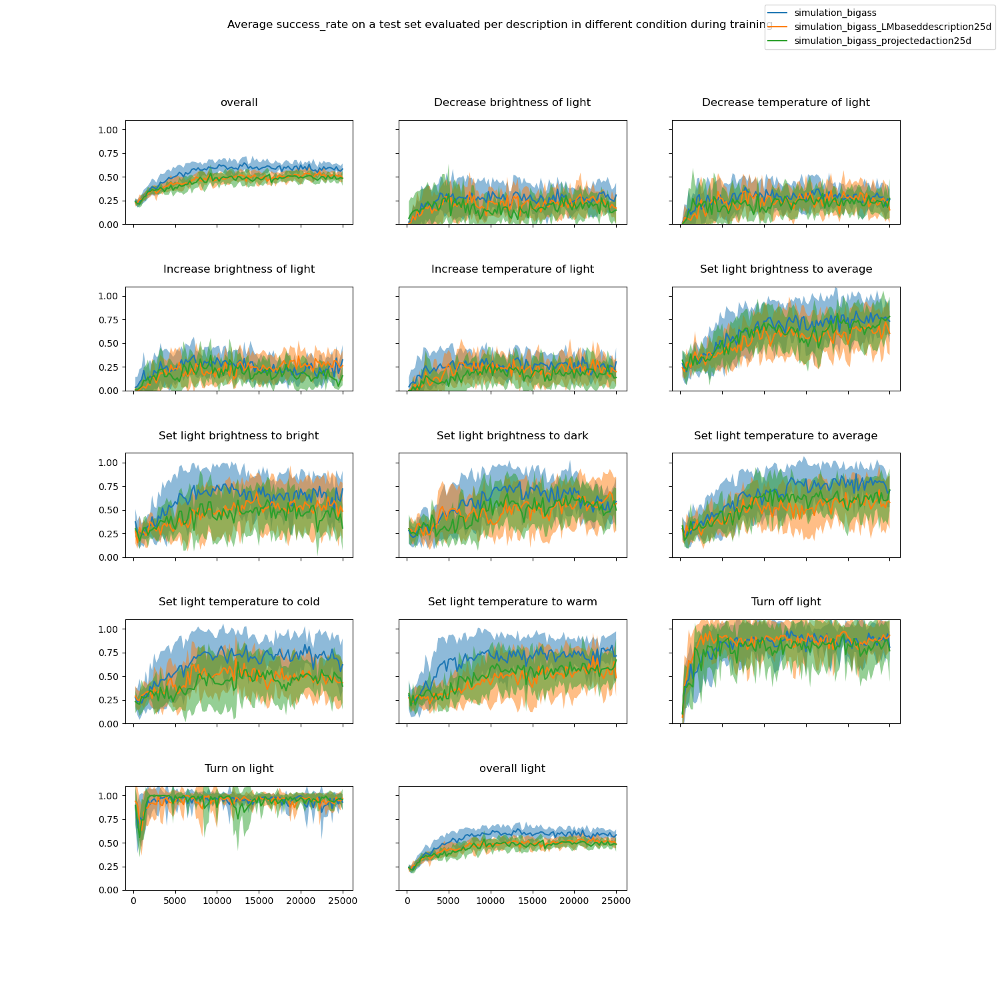

'results/simulation_bigass_LMbaseddescription25d_0/test_record.jbl'
done
'results/simulation_bigass_LMbaseddescription25d_8/test_record.jbl'
done
'results/simulation_bigass_LMbaseddescription25d_5/test_record.jbl'
done
'results/simulation_bigass_LMbaseddescription25d_1/test_record.jbl'
done
'results/simulation_bigass_LMbaseddescription25d_2/test_record.jbl'
done
'results/simulation_bigass_LMbaseddescription25d_3/test_record.jbl'
done
'results/simulation_bigass_LMbaseddescription25d_6/test_record.jbl'
done
'results/simulation_bigass_LMbaseddescription25d_4/test_record.jbl'
done
'results/simulation_bigass_LMbaseddescription25d_7/test_record.jbl'
done
'results/simulation_bigass_projectedaction25d_5/test_record.jbl'
done
'results/simulation_bigass_projectedaction25d_0/test_record.jbl'
done
'results/simulation_bigass_projectedaction25d_3/test_record.jbl'
done
'results/simulation_bigass_projectedaction25d_4/test_record.jbl'
done
'results/simulation_bigass_projectedaction25d_7/test_record.jbl

In [8]:
folder = "results/"
simulation_names = ["simulation_bigass", "simulation_bigass_LMbaseddescription25d", "simulation_bigass_projectedaction25d"]
d = [(s, glob.glob(f'{folder}{s}_[0-9]*')) for s in simulation_names]
# s = "simpleAtt"
# d.append((s, glob.glob(f'{folder}{s}_[0-9]')))
# s = 'simulation_no_clipping_up_target_10_no_per'
# f8 = (s, glob.glob(f'results/temp/{s}*'))

# s = 'simulation_no_clipping_up_target_10'
# f9 = (s, glob.glob(f'results/temp/{s}*'))

fig, axes = compare_average_success_rate(*d)

# Plot averaged simulation

In [47]:
# print(glob.glob(f'results/simulation_*'))
simulation_name = 'AttentionFlatQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/simulation_{simulation_name}*')
print(folders)

['results/simulation_AttentionFlatQnet_5', 'results/simulation_AttentionFlatQnet_9', 'results/simulation_AttentionFlatQnet_2', 'results/simulation_AttentionFlatQnet_10', 'results/simulation_AttentionFlatQnet_11', 'results/simulation_AttentionFlatQnet_4', 'results/simulation_AttentionFlatQnet_1', 'results/simulation_AttentionFlatQnet_8', 'results/simulation_AttentionFlatQnet_3', 'results/simulation_AttentionFlatQnet_6', 'results/simulation_AttentionFlatQnet_7']


In [48]:
flattened_records, reached_counters, target_counters, discovery_records, episodes = load_simulation_list(folders)
reached_averaged = {k: (np.round(np.mean(v)),np.round(np.std(v), 1)) for k,v in reached_counters.items()}
average_discovery = {k: (np.round(np.mean(v)),np.round(np.std(v), 1)) for k,v in discovery_records.items()}
average_flattened = {k: np.mean(v, 0) for k,v in flattened_records.items()}
std_flattened = {k: np.std(v, 0) for k,v in flattened_records.items()}

'results/simulation_AttentionFlatQnet_5/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_9/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_2/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_10/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_11/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_4/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_1/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_8/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_3/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_6/test_record.jbl'
done
'results/simulation_AttentionFlatQnet_7/test_record.jbl'
done


<IPython.core.display.Javascript object>


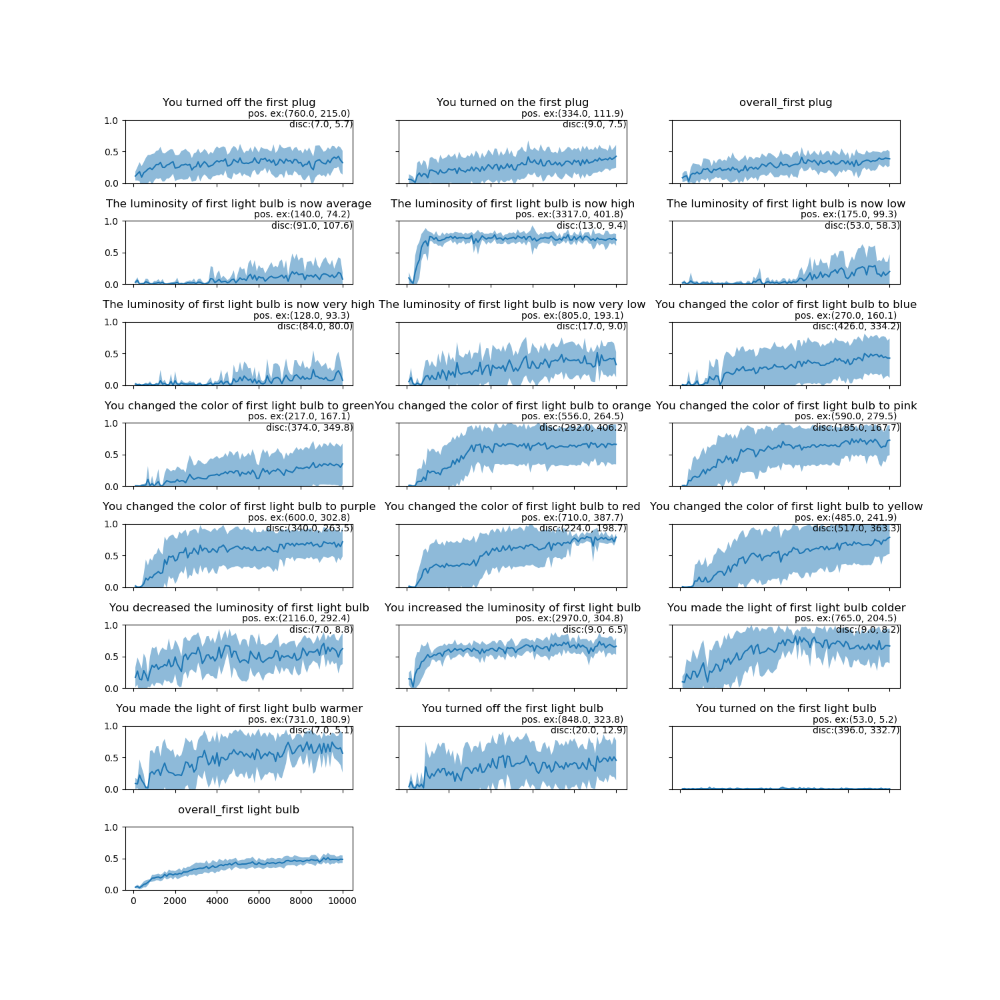

In [49]:
plot_average_success_rates(episodes, average_flattened, reached_averaged, std_record=std_flattened, iter_discovery=average_discovery)

# Usage

<IPython.core.display.Javascript object>


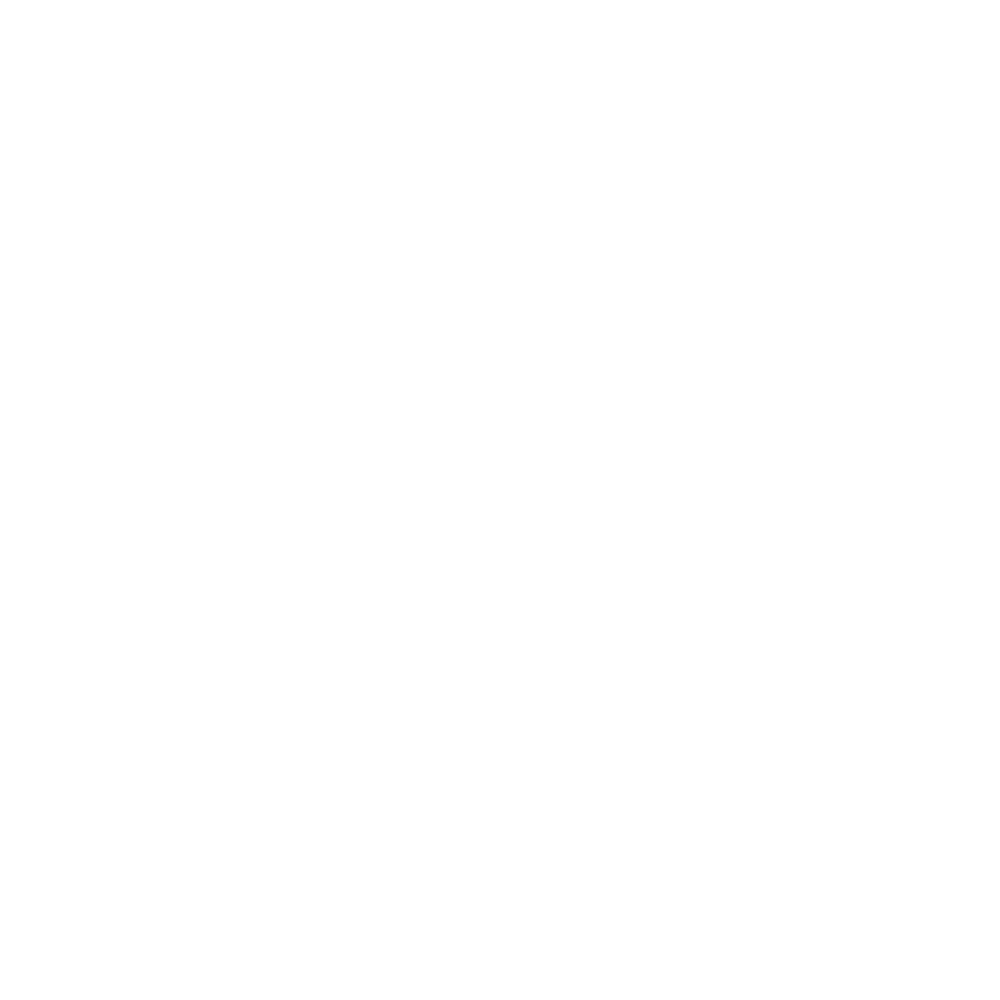

ValueError: Number of rows must be a positive integer, not 0

In [8]:
simulation_name = 'test' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/test/')
load_and_plot(folders)

'results/first_round/simulation_AttentionFlatQnet_5/test_record.jbl'
done
'results/first_round/simulation_AttentionFlatQnet_9/test_record.jbl'
done
'results/first_round/simulation_AttentionFlatQnet_2/test_record.jbl'
done
'results/first_round/simulation_AttentionFlatQnet_10/test_record.jbl'
done
'results/first_round/simulation_AttentionFlatQnet_11/test_record.jbl'
done
'results/first_round/simulation_AttentionFlatQnet_4/test_record.jbl'
done
'results/first_round/simulation_AttentionFlatQnet_1/test_record.jbl'
done
'results/first_round/simulation_AttentionFlatQnet_8/test_record.jbl'
done
'results/first_round/simulation_AttentionFlatQnet_3/test_record.jbl'
done
'results/first_round/simulation_AttentionFlatQnet_6/test_record.jbl'
done
'results/first_round/simulation_AttentionFlatQnet_7/test_record.jbl'
done


<IPython.core.display.Javascript object>


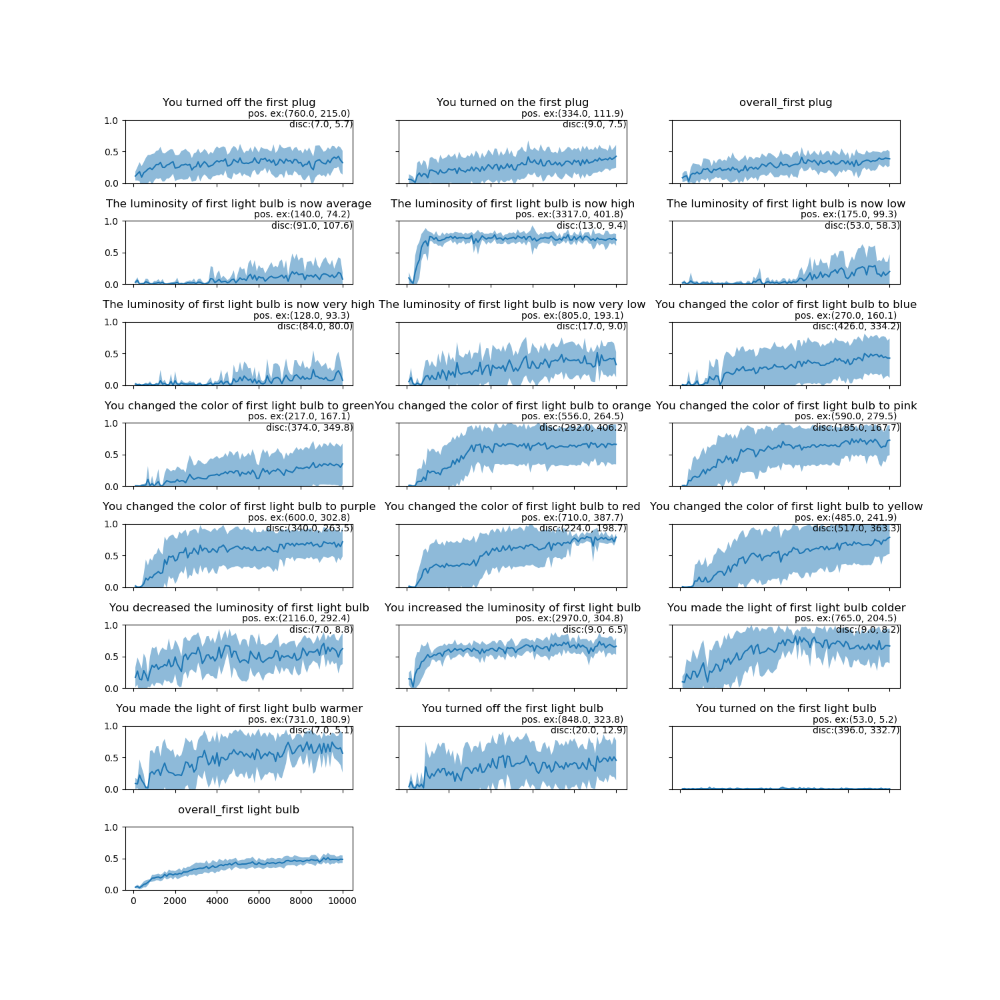

In [19]:
simulation_name = 'AttentionFlatQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/first_round/simulation_{simulation_name}*')
load_and_plot(folders)

'results/first_round/simulation_DeepSetQnet_8/test_record.jbl'
done
'results/first_round/simulation_DeepSetQnet_3/test_record.jbl'
done
'results/first_round/simulation_DeepSetQnet_1/test_record.jbl'
done
'results/first_round/simulation_DeepSetQnet_11/test_record.jbl'
done
'results/first_round/simulation_DeepSetQnet_7/test_record.jbl'
done
'results/first_round/simulation_DeepSetQnet_5/test_record.jbl'
done
'results/first_round/simulation_DeepSetQnet_2/test_record.jbl'
done
'results/first_round/simulation_DeepSetQnet_9/test_record.jbl'
done
'results/first_round/simulation_DeepSetQnet_6/test_record.jbl'
done
'results/first_round/simulation_DeepSetQnet_4/test_record.jbl'
done
'results/first_round/simulation_DeepSetQnet_10/test_record.jbl'
done


<IPython.core.display.Javascript object>


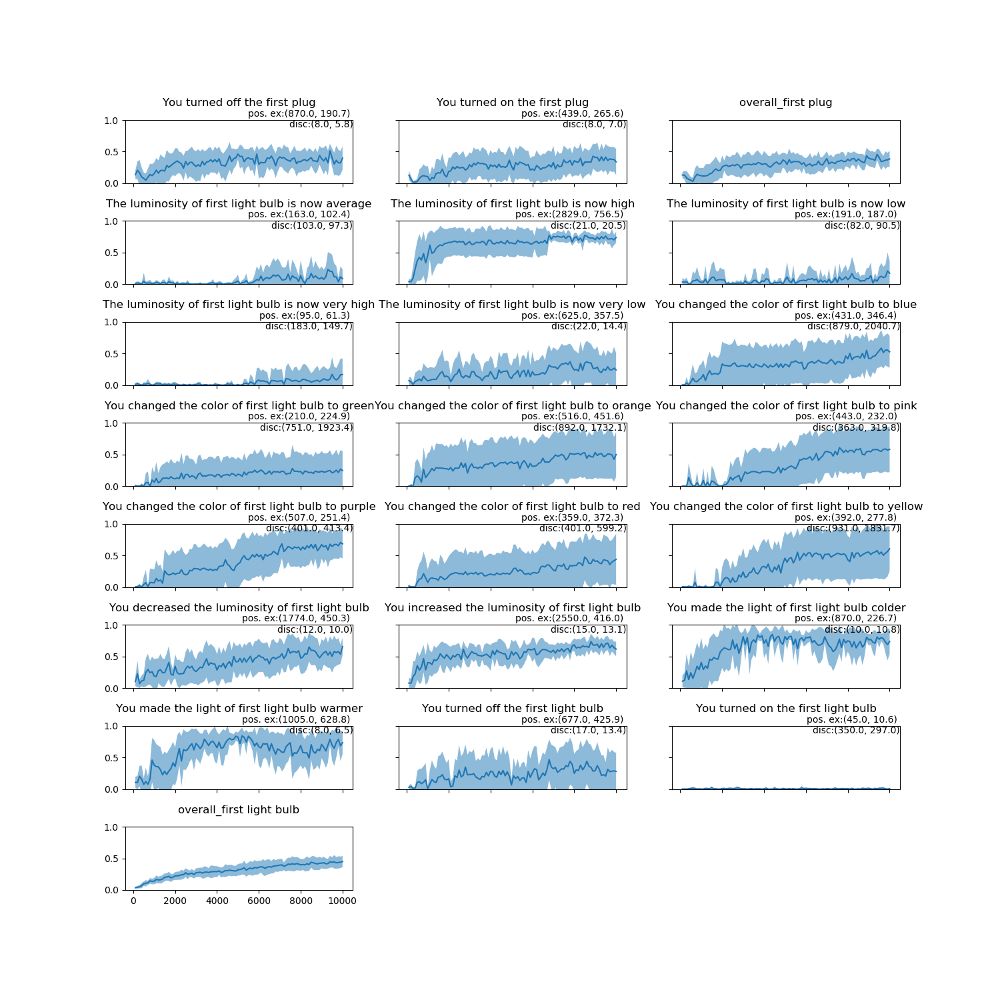

In [20]:
simulation_name = 'DeepSetQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/first_round/simulation_{simulation_name}*')
load_and_plot(folders)

'results/second_round/simulation_NoAttentionFlatQnet_0/test_record.jbl'
done
'results/second_round/simulation_NoAttentionFlatQnet_3/test_record.jbl'
done
'results/second_round/simulation_NoAttentionFlatQnet_4/test_record.jbl'
done
'results/second_round/simulation_NoAttentionFlatQnet_2/test_record.jbl'
done
'results/second_round/simulation_NoAttentionFlatQnet_1/test_record.jbl'
done


<IPython.core.display.Javascript object>


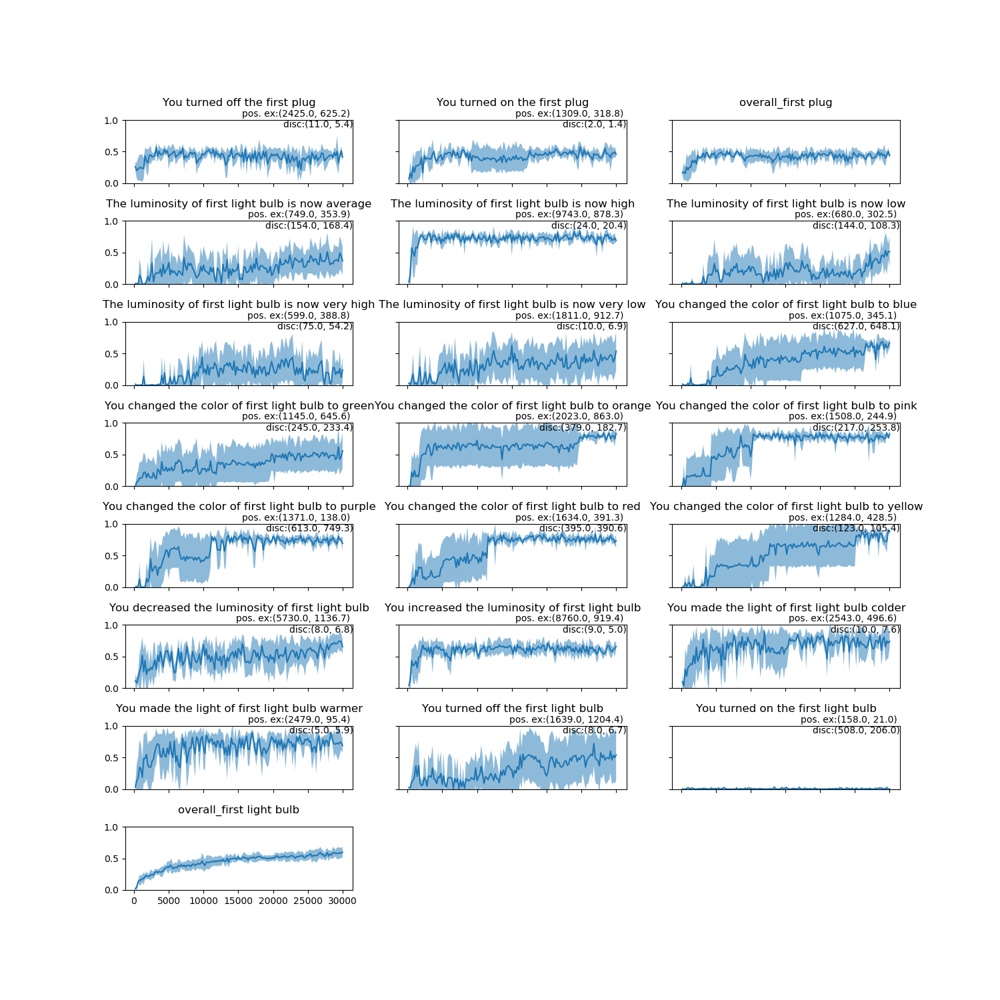

In [21]:
simulation_name = 'NoAttentionFlatQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/second_round/simulation_{simulation_name}*')
load_and_plot(folders)

'results/second_round/simulation_AttentionFlatQnet_2/test_record.jbl'
done
'results/second_round/simulation_AttentionFlatQnet_4/test_record.jbl'
done
'results/second_round/simulation_AttentionFlatQnet_1/test_record.jbl'
done
'results/second_round/simulation_AttentionFlatQnet_3/test_record.jbl'
done
'results/second_round/simulation_AttentionFlatQnet_0/test_record.jbl'
done


<IPython.core.display.Javascript object>


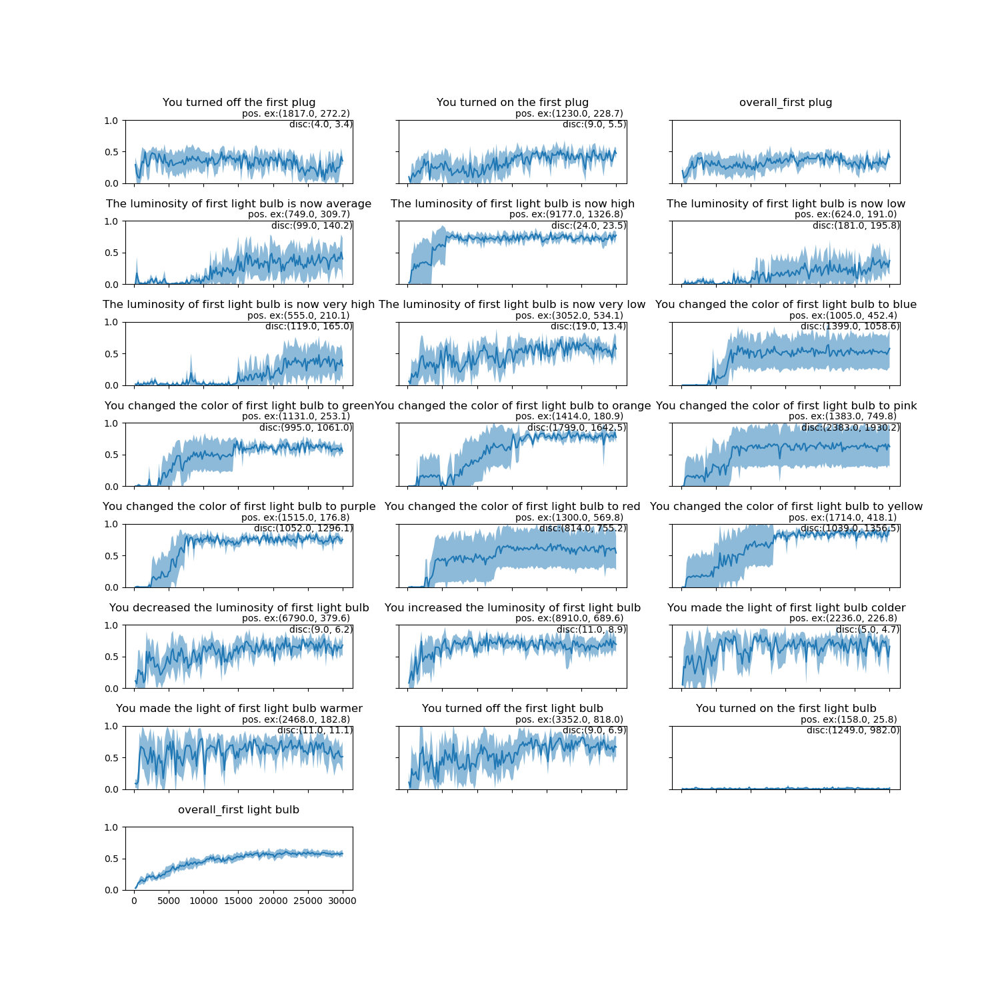

In [22]:
simulation_name = 'AttentionFlatQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/second_round/simulation_{simulation_name}*')
load_and_plot(folders)

'results/second_round/simulation_DeepSetQnet_3/test_record.jbl'
done
'results/second_round/simulation_DeepSetQnet_1/test_record.jbl'
done
'results/second_round/simulation_DeepSetQnet_0/test_record.jbl'
done
'results/second_round/simulation_DeepSetQnet_2/test_record.jbl'
done
'results/second_round/simulation_DeepSetQnet_4/test_record.jbl'
done


<IPython.core.display.Javascript object>


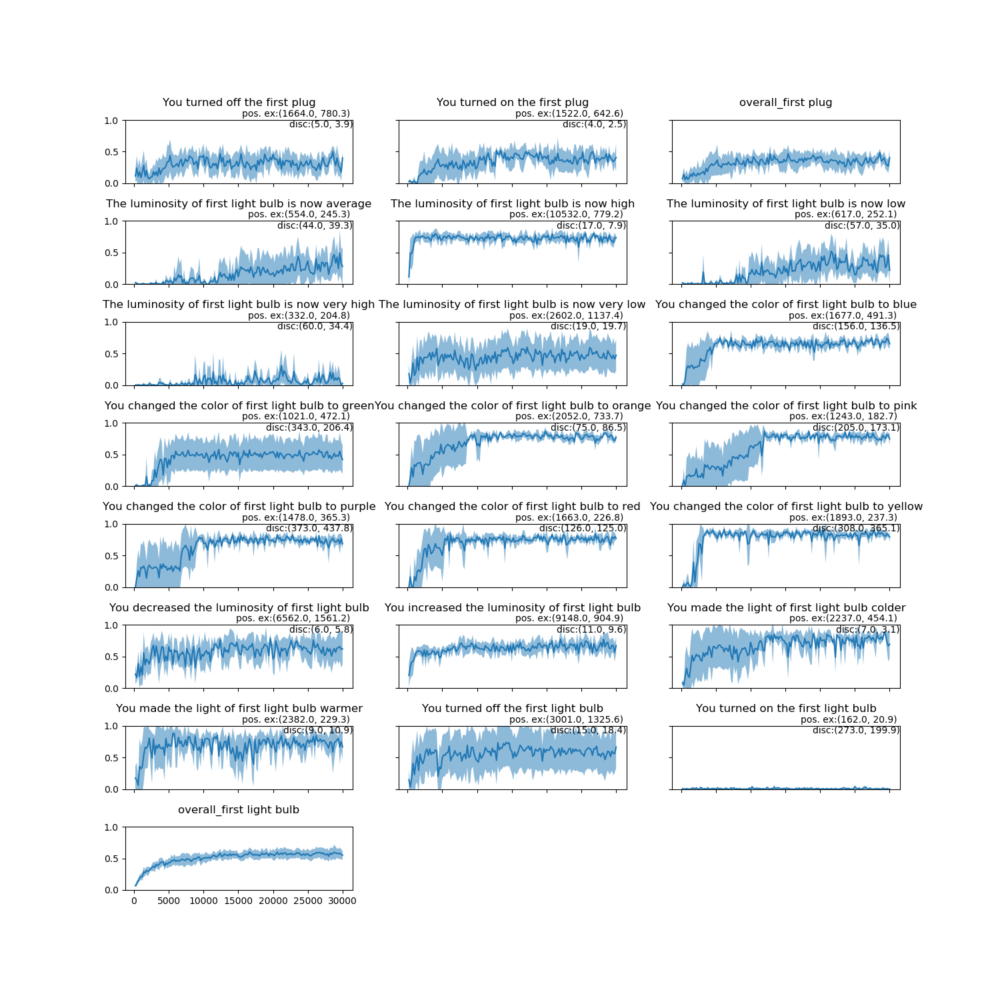

In [23]:
simulation_name = 'DeepSetQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/second_round/simulation_{simulation_name}*')
load_and_plot(folders)

'results/Simulation pretrained LM/simulation_pretrained_lm_5/test_record.jbl'
done
'results/Simulation pretrained LM/simulation_pretrained_lm_0/test_record.jbl'
done
'results/Simulation pretrained LM/simulation_pretrained_lm_1/test_record.jbl'
done
'results/Simulation pretrained LM/simulation_pretrained_lm_2/test_record.jbl'
done


<IPython.core.display.Javascript object>


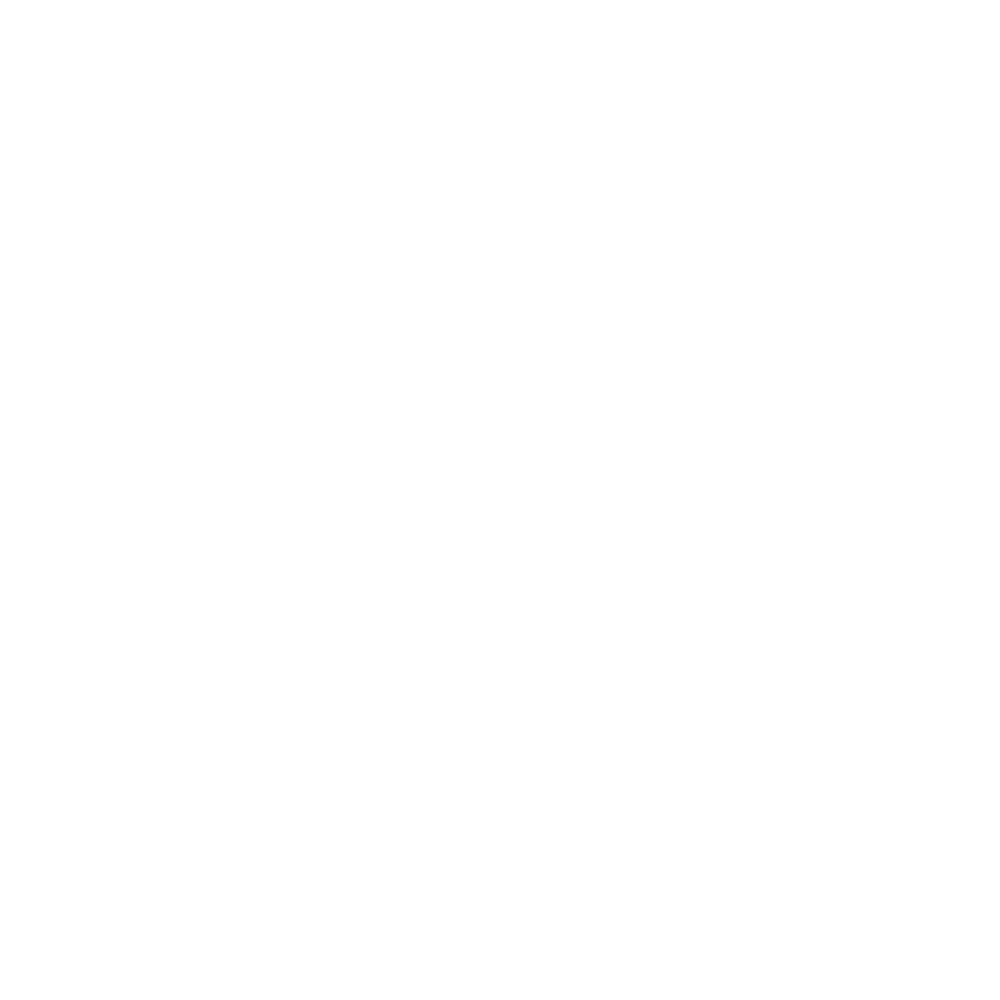

In [10]:
simulation_name = 'pretrained_lm' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
folders = glob.glob(f'results/Simulation pretrained LM/simulation_{simulation_name}*')
load_and_plot(folders)

# Comparision

['results/bigass/simulation_bigass_25',
 'results/bigass/simulation_bigass_18',
 'results/bigass/simulation_bigass_20',
 'results/bigass/simulation_bigass_28',
 'results/bigass/simulation_bigass_23',
 'results/bigass/simulation_bigass_21',
 'results/bigass/simulation_bigass_24',
 'results/bigass/simulation_bigass_29',
 'results/bigass/simulation_bigass_26',
 'results/bigass/simulation_bigass_19',
 'results/bigass/simulation_bigass_27',
 'results/bigass/simulation_bigass_22']
['results/bigass_stdlvl/simulation_bigass_stdlvl_3',
 'results/bigass_stdlvl/simulation_bigass_stdlvl_0',
 'results/bigass_stdlvl/simulation_bigass_stdlvl_2',
 'results/bigass_stdlvl/simulation_bigass_stdlvl_1',
 'results/bigass_stdlvl/simulation_bigass_stdlvl_5',
 'results/bigass_stdlvl/simulation_bigass_stdlvl_4']
7 3


<IPython.core.display.Javascript object>


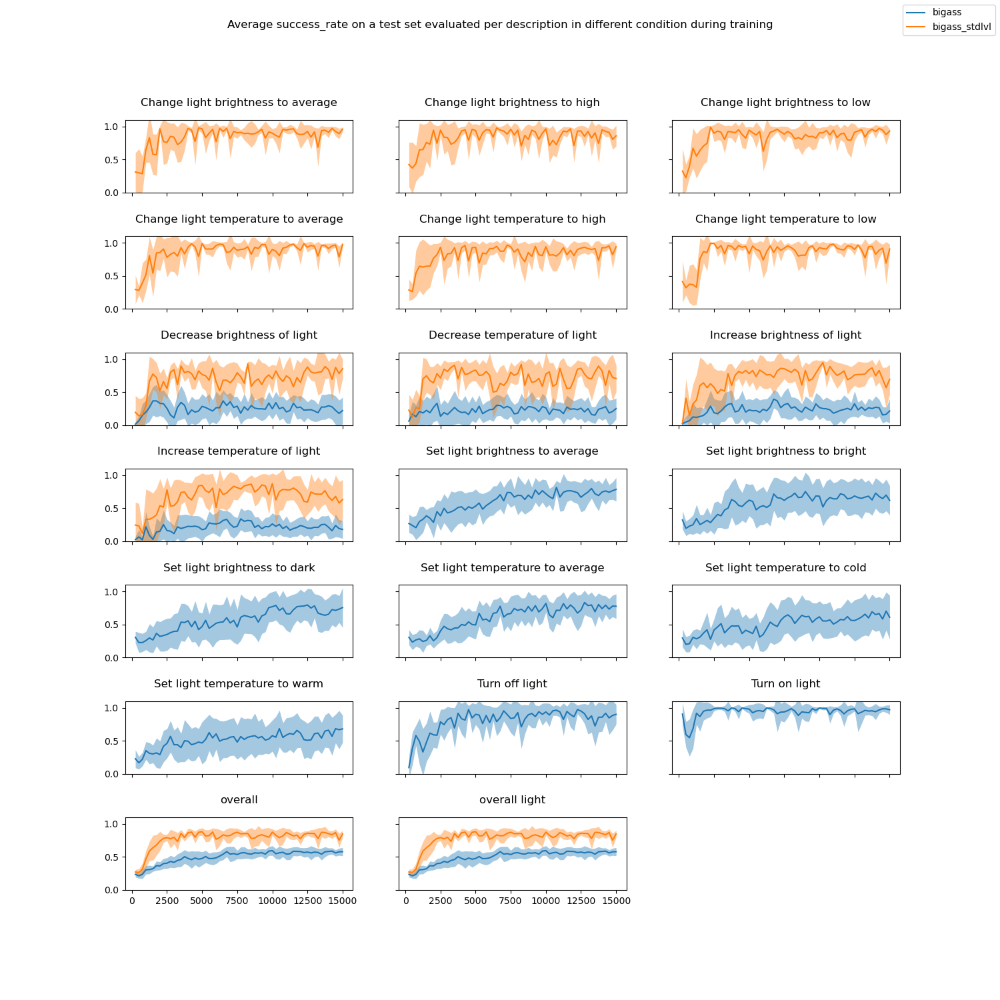

bigass
bigass_stdlvl
************************************ ['bigass', 'bigass_stdlvl']


(<Figure size 1500x1500 with 21 Axes>,
 {'Change light brightness to average': <AxesSubplot:title={'center':'Change light brightness to average'}>,
  'Change light brightness to high': <AxesSubplot:title={'center':'Change light brightness to high'}>,
  'Change light brightness to low': <AxesSubplot:title={'center':'Change light brightness to low'}>,
  'Change light temperature to average': <AxesSubplot:title={'center':'Change light temperature to average'}>,
  'Change light temperature to high': <AxesSubplot:title={'center':'Change light temperature to high'}>,
  'Change light temperature to low': <AxesSubplot:title={'center':'Change light temperature to low'}>,
  'Decrease brightness of light': <AxesSubplot:title={'center':'Decrease brightness of light'}>,
  'Decrease temperature of light': <AxesSubplot:title={'center':'Decrease temperature of light'}>,
  'Increase brightness of light': <AxesSubplot:title={'center':'Increase brightness of light'}>,
  'Increase temperature of light': <

In [36]:
simulation_names = ['bigass', 'bigass_stdlvl']
folders = [glob.glob(f'results/{s}/*') for s in simulation_names]
compare_average_success_rate(*zip(simulation_names, folders))
# a,b = zip(simulation_names, folders)
# print(a,b)

'results/mse_pretrained_lm/simulation_mse_pretrained_lm_2/test_record.jbl'
done
'results/mse_pretrained_lm/simulation_mse_pretrained_lm_4/test_record.jbl'
done
'results/mse_pretrained_lm/simulation_mse_pretrained_lm_5/test_record.jbl'
done
'results/mse_pretrained_lm/simulation_mse_pretrained_lm_6/test_record.jbl'
done


<IPython.core.display.Javascript object>


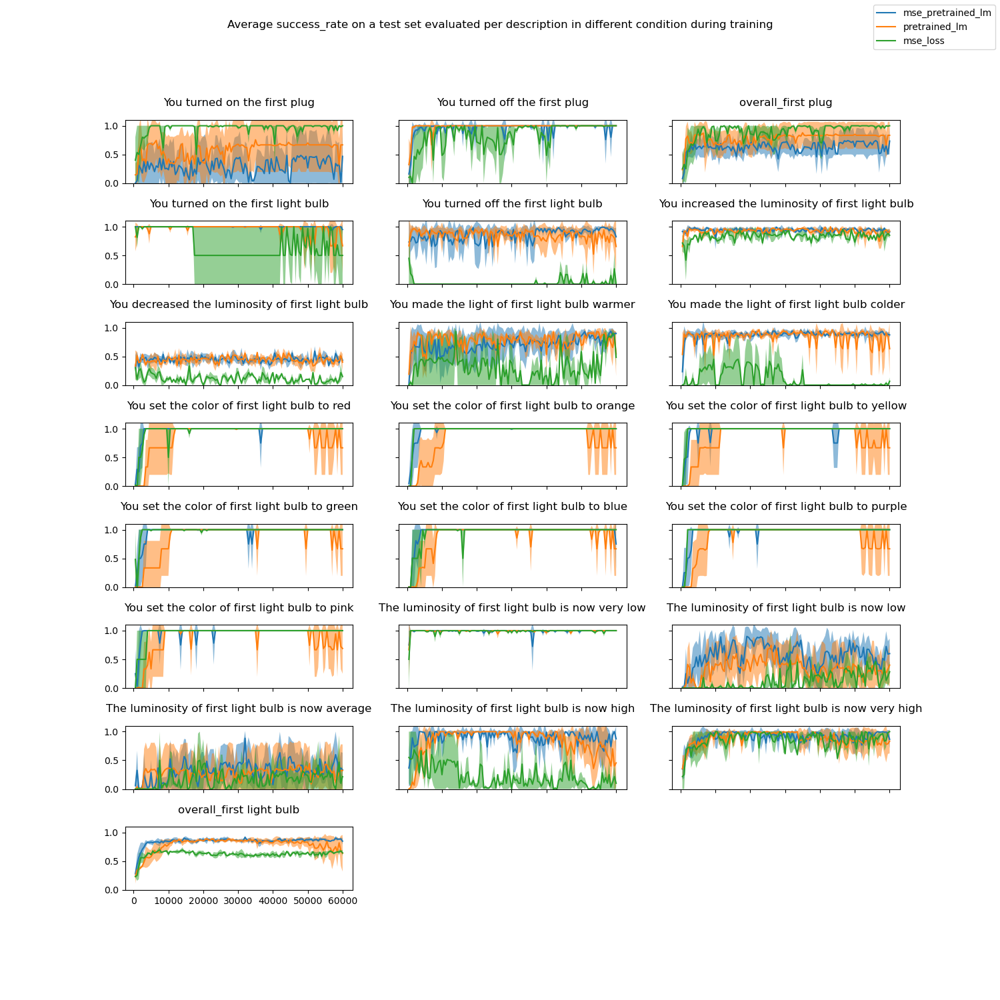

'results/pretrained_lm/simulation_pretrained_lm_5/test_record.jbl'
done
'results/pretrained_lm/simulation_pretrained_lm_0/test_record.jbl'
done
'results/pretrained_lm/simulation_pretrained_lm_3/test_record.jbl'
done
'results/mse_loss/simulation_mse_loss_5/test_record.jbl'
done
'results/mse_loss/simulation_mse_loss_2/test_record.jbl'
done
************************************ ['mse_pretrained_lm', 'pretrained_lm', 'mse_loss']


In [11]:
# simulation_name = 'NoAttentionFlatQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
# folders = glob.glob(f'results/third_round/simulation_{simulation_name}*')
# load_and_plot(folders)

# s1 = 'NoAttentionFlatQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
# f1 = glob.glob(f'results/second_round/simulation_{s1}*')

# s2 = 'AttentionFlatQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
# f2 = glob.glob(f'results/second_round/simulation_{s2}*')

# s3 = 'DeepSetQnet' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
# f3 = glob.glob(f'results/second_round/simulation_{s3}*')

# s4 = 'without_do_nothing' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
# f4 = glob.glob(f'results/without_do_nothing/simulation_pretrained_lm*')

# s5 = 'with_do_nothing' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
# f5 = glob.glob(f'results/with_do_nothing/simulation_pretrained_lm*')

s6 = 'mse_pretrained_lm' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
f6 = glob.glob(f'results/mse_pretrained_lm/*')


s7 = 'pretrained_lm' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
f7 = glob.glob(f'results/pretrained_lm/*')


s8 = 'mse_loss' #'DeepSetQnet' # 'NoAttentionFlatQnet' #  'AttentionFlatQnet'
f8 = glob.glob(f'results/mse_loss/*')


# fig, axes = compare_average_success_rate((s1, f1), (s2, f2), (s3, f3), (s4, f4))
fig, axes = compare_average_success_rate((s6, f6), (s7, f7), (s8, f8))

'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_0/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_8/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_24/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_20/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_25/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_2/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_13/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_7/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_12/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_6/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_no_pretrained_4/test_record.jbl'
done
'results/batch_mse_no_pretrained/simulation_mse_n

<IPython.core.display.Javascript object>


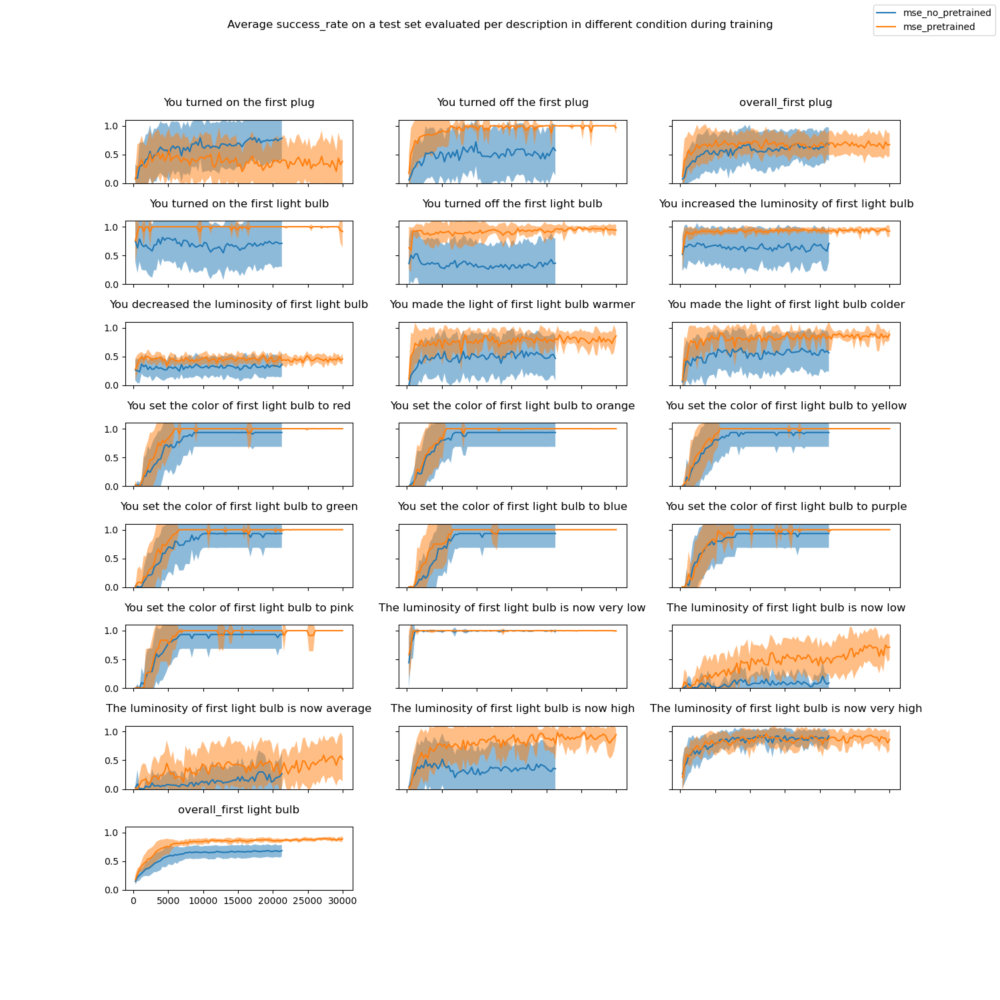

'results/batch_mse_pretrained/simulation_mse_pretrained_35/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_14/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_10/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_22/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_15/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_7/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_20/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_27/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_16/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_9/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_6/test_record.jbl'
done
'results/batch_mse_pretrained/simulation_mse_pretrained_17/test_record.jbl'
done
*******************************

In [9]:
s = 'mse_no_pretrained'
f6 = (s,glob.glob(f'results/batch_{s}/*'))

s = 'mse_pretrained'
f7 = (s,glob.glob(f'results/batch_{s}/*'))

# s = 'smooth_no_pretrained'
# f8 = (s,glob.glob(f'results/batch_{s}/*'))

# s = 'smooth_pretrained'
# f9 = (s,glob.glob(f'results/batch_{s}/*'))


# fig, axes = compare_average_success_rate((s1, f1), (s2, f2), (s3, f3), (s4, f4))
fig, axes = compare_average_success_rate(f6,f7)

'results/simulation_new_pre_1/test_record.jbl'
done
'results/simulation_new_pre_2/test_record.jbl'
done
'results/simulation_new_pre_0/test_record.jbl'
done


<IPython.core.display.Javascript object>


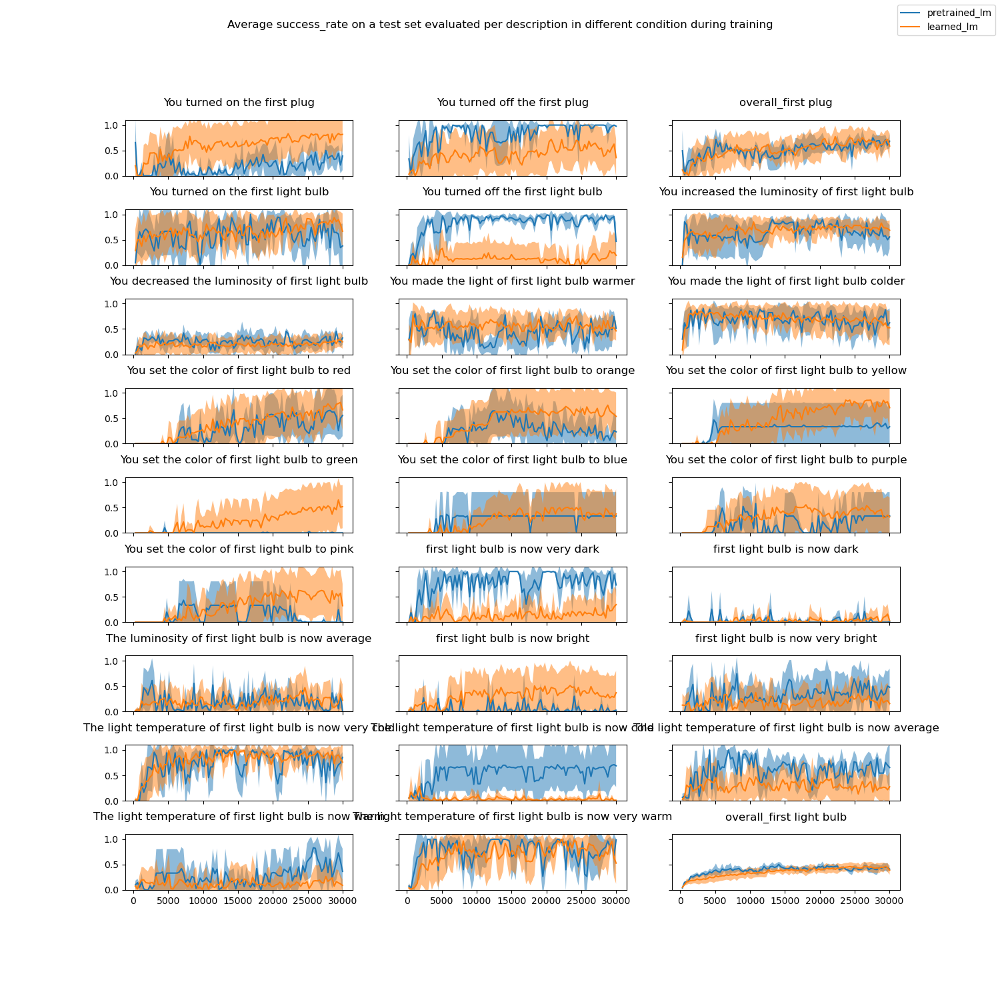

'results/simulation_tv_57/test_record.jbl'
done
'results/simulation_tv_62/test_record.jbl'
done
'results/simulation_tv_59/test_record.jbl'
done
'results/simulation_tv_60/test_record.jbl'
done
'results/simulation_tv_56/test_record.jbl'
done
'results/simulation_tv_63/test_record.jbl'
done
'results/simulation_tv_54/test_record.jbl'
done
'results/simulation_tv_58/test_record.jbl'
done
************************************ ['pretrained_lm', 'learned_lm']


In [27]:
s = 'pretrained_lm'
f6 = (s,glob.glob(f'results/simulation_new_pre*'))

s = 'learned_lm'
f7 = (s,glob.glob(f'results/simulation_tv*'))

# s = 'smooth_no_pretrained'
# f8 = (s,glob.glob(f'results/batch_{s}/*'))

# s = 'smooth_pretrained'
# f9 = (s,glob.glob(f'results/batch_{s}/*'))

fig, axes = compare_average_success_rate(f6, f7)

'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_6/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_2/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_0/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_5/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_7/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_3/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_4/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_9/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_8/test_record.jbl'
done
'results/simulation_simple_lightbulb_no_lm/simulation_simple_lightbulb_no_lm_10/test_record

<IPython.core.display.Javascript object>


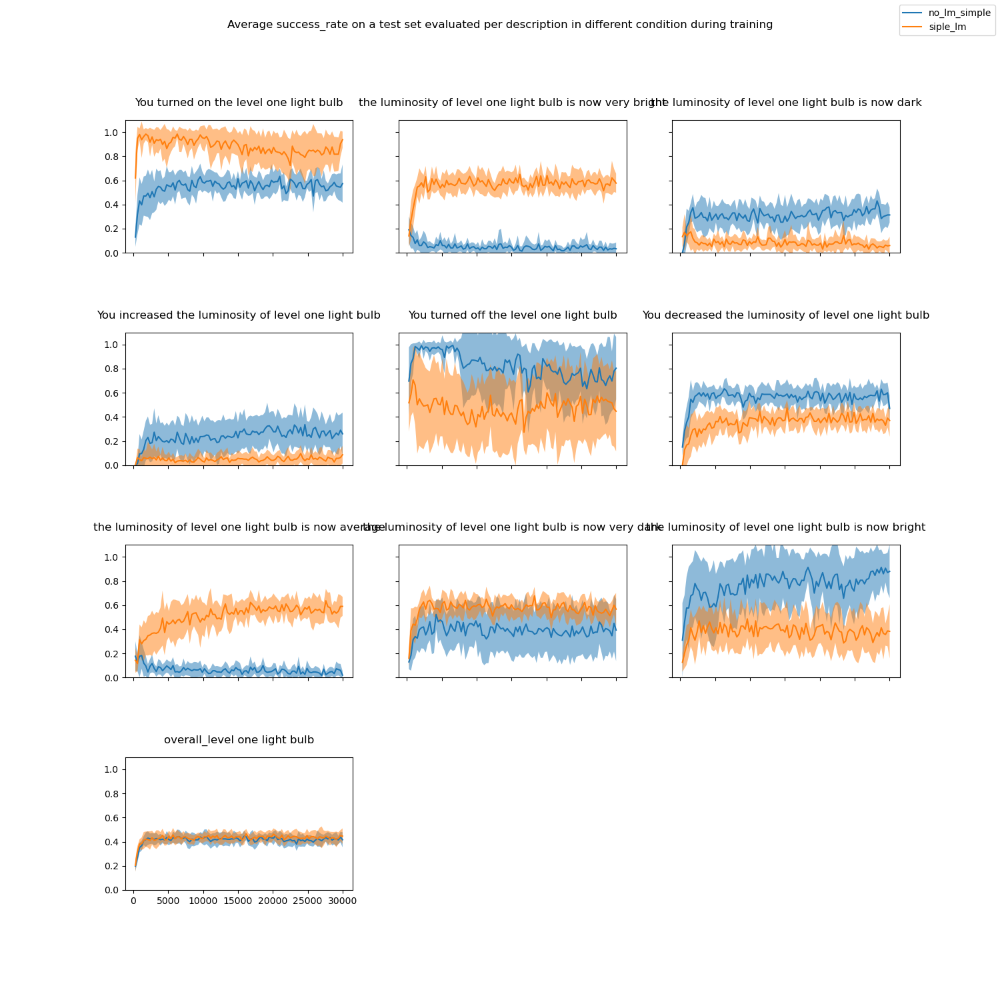

'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_8/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_9/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_1/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_2/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_0/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_7/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_4/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_6/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_3/test_record.jbl'
done
'results/simulation_simple_lightbulb_lm/simulation_simple_lightbulb_lm_5/test_record.jbl'
done
************************************ ['no_lm_simpl

In [21]:
s = 'no_lm_simple'
f6 = (s, glob.glob(f'results/simulation_simple_lightbulb_no_lm/*'))

s = 'siple_lm'
f7 = (s,glob.glob(f'results/simulation_simple_lightbulb_lm/*'))

# s = 'smooth_no_pretrained'
# f8 = (s,glob.glob(f'results/batch_{s}/*'))

# s = 'smooth_pretrained'
# f9 = (s,glob.glob(f'results/batch_{s}/*'))

fig, axes = compare_average_success_rate(f6, f7)

In [24]:
s = 'two_lightbulb_no_lm'
f6 = (s, glob.glob(f'results/simulation_two_lightbulb_no_lm/*'))

s = 'three_lightbulb_no_lm'
f7 = (s,glob.glob(f'results/simulation_three_lightbulb_no_lm/*'))

# s = 'smooth_no_pretrained'
# f8 = (s,glob.glob(f'results/batch_{s}/*'))

# s = 'smooth_pretrained'
# f9 = (s,glob.glob(f'results/batch_{s}/*'))

fig, axes = compare_average_success_rate(f6, f7)

'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_12/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_9/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_11/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_8/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_13/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_7/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_6/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_10/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_14/test_record.jbl'
done
'results/simulation_two_lightbulb_no_lm/simulation_two_lightbulb_no_lm_15/test_record.jbl'
done


<IPython.core.display.Javascript object>

'results/simulation_three_lightbulb_no_lm/simulation_three_lightbulb_no_lm_4/test_record.jbl'
done
'results/simulation_three_lightbulb_no_lm/simulation_three_lightbulb_no_lm_3/test_record.jbl'
done
'results/simulation_three_lightbulb_no_lm/simulation_three_lightbulb_no_lm_1/test_record.jbl'
done
'results/simulation_three_lightbulb_no_lm/simulation_three_lightbulb_no_lm_5/test_record.jbl'
done
'results/simulation_three_lightbulb_no_lm/simulation_three_lightbulb_no_lm_0/test_record.jbl'
done
'results/simulation_three_lightbulb_no_lm/simulation_three_lightbulb_no_lm_6/test_record.jbl'
done
'results/simulation_three_lightbulb_no_lm/simulation_three_lightbulb_no_lm_2/test_record.jbl'
done
'results/simulation_three_lightbulb_no_lm/simulation_three_lightbulb_no_lm_9/test_record.jbl'
done


IndexError: index 9 is out of bounds for axis 0 with size 9

In [19]:
glob.glob(f'results/simulation_simple_lightbulb_no_lm*')

['results/simulation_simple_lightbulb_no_lm']

In [17]:
%ls

 Draft.ipynb   README.md        'Results analysis.ipynb'   src/
 figures/      requirement.yml  'Reward Function .ipynb'
 model/        results/         'RL4IoT protocole.odt'


<IPython.core.display.Javascript object>


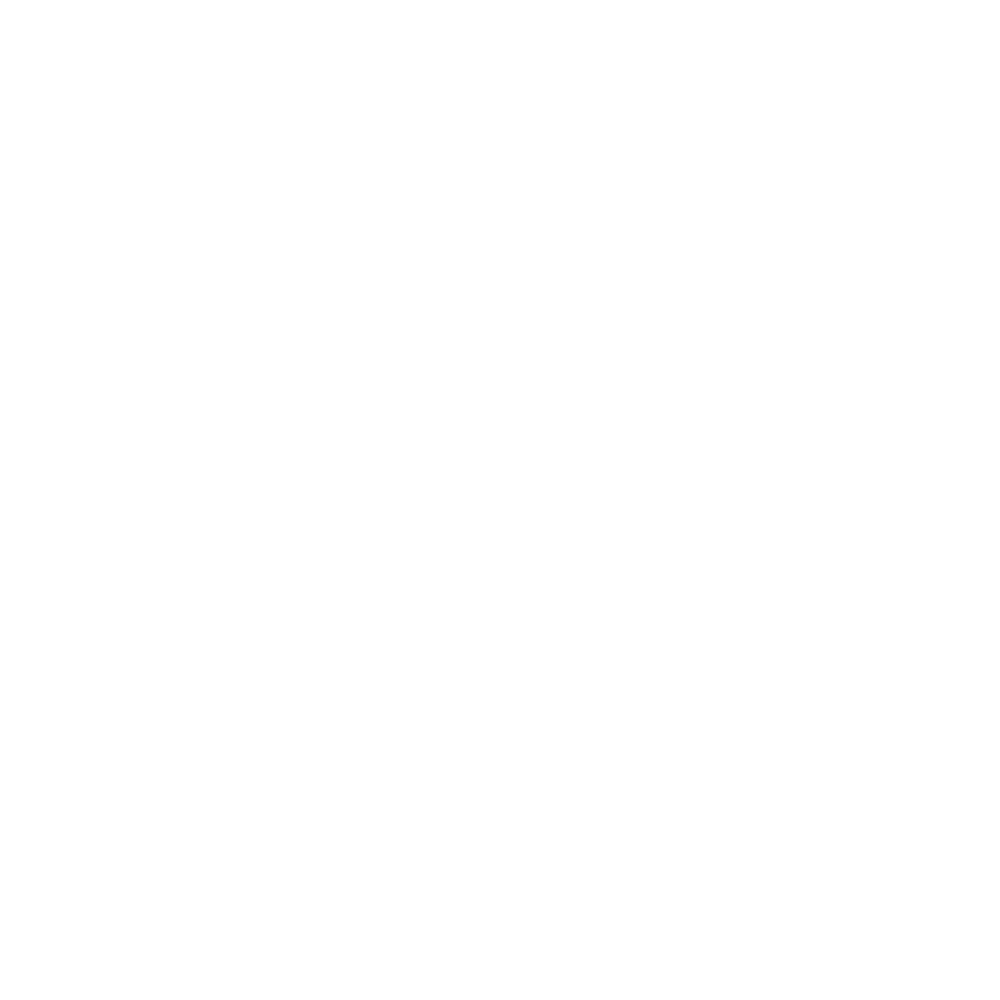

ValueError: Number of rows must be a positive integer, not 0

In [5]:
s = 'test'
f6 = (s, glob.glob(f'results/tes*'))

fig, axes = compare_average_success_rate(f6)

In [24]:
s = 'simulation_up_target_10'
f6 = (s, glob.glob(f'results/temp/{s}*'))

s = 'simulation_no_clipping_up_target_10_no_per_no_double'
f7 = (s, glob.glob(f'results/temp/{s}*'))

# s = 'simulation_no_clipping_up_target_10_no_per'
# f8 = (s, glob.glob(f'results/temp/{s}*'))

# s = 'simulation_no_clipping_up_target_10'
# f9 = (s, glob.glob(f'results/temp/{s}*'))

fig, axes = compare_average_success_rate(f6, f7, f8, f9)

'results/temp/simulation_up_target_10_2/test_record.jbl'
done
'results/temp/simulation_up_target_10_0/test_record.jbl'
done
'results/temp/simulation_up_target_10_1/test_record.jbl'
done
'results/temp/simulation_up_target_10_3/test_record.jbl'
done


<IPython.core.display.Javascript object>

'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_2/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_3/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_0/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_1/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_2/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_2/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_3/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_0/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_1/test_record.jbl'


IndexError: list index out of range

In [25]:
glob.glob(f'results/temp/{simulation_name}*/')

[]

In [22]:
simulation_name

'test'

'results/temp/simulation_up_target_10_2/test_record.jbl'
done
'results/temp/simulation_up_target_10_0/test_record.jbl'
done
'results/temp/simulation_up_target_10_1/test_record.jbl'
done
'results/temp/simulation_up_target_10_3/test_record.jbl'
done


<IPython.core.display.Javascript object>


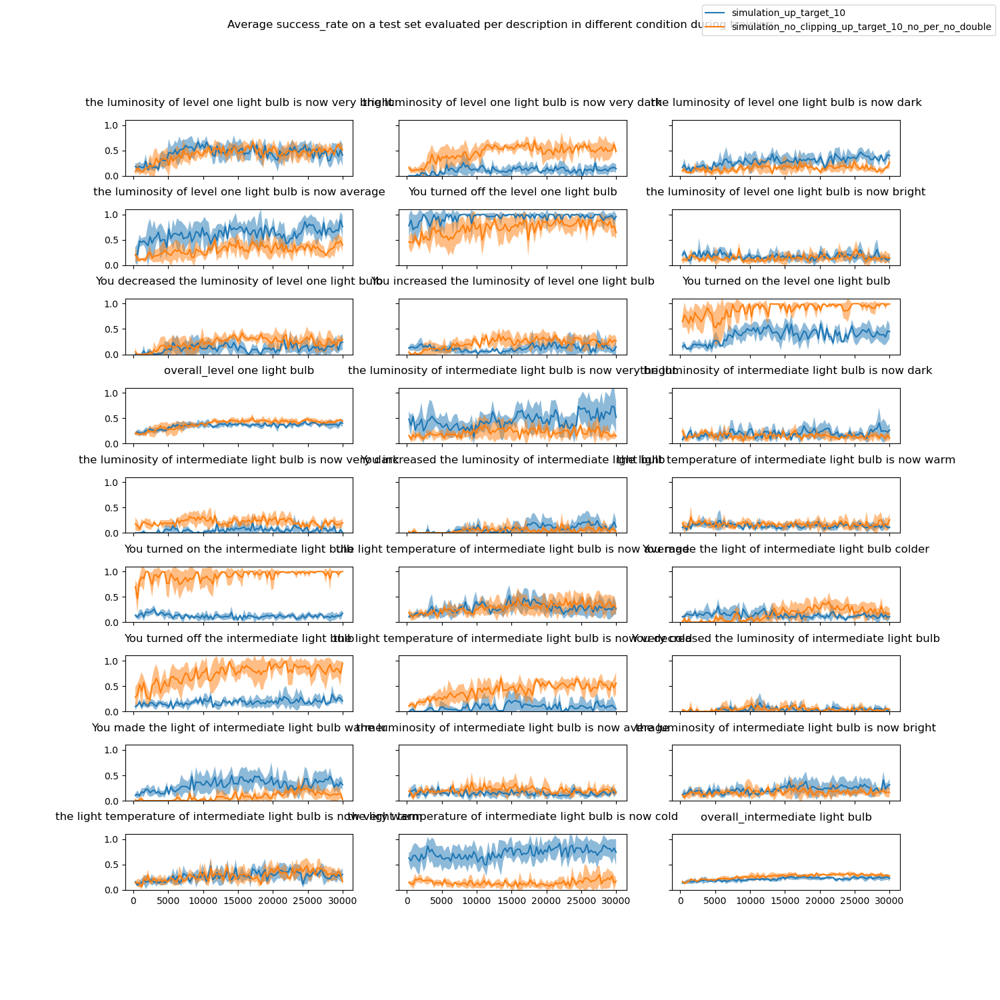

'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_2/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_3/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_0/test_record.jbl'
done
'results/temp/simulation_no_clipping_up_target_10_no_per_no_double_1/test_record.jbl'
done
************************************ ['simulation_up_target_10', 'simulation_no_clipping_up_target_10_no_per_no_double']


In [11]:
s = 'simulation_up_target_10'
f6 = (s, glob.glob(f'results/temp/{s}*'))

s = 'simulation_no_clipping_up_target_10_no_per_no_double'
f7 = (s, glob.glob(f'results/temp/{s}*'))

# s = 'simulation_no_clipping_up_target_10_no_per'
# f8 = (s, glob.glob(f'results/temp/{s}*'))

# s = 'simulation_no_clipping_up_target_10'
# f9 = (s, glob.glob(f'results/temp/{s}*'))

fig, axes = compare_average_success_rate(f6, f7)